In [1]:
import pandas as pd
import networkx as nx
import plotly.express as px
import plotly.graph_objs as go

In [2]:
df = pd.read_pickle('../data/pickle/podcasts_clean.pkl')

In [3]:
df.sample(2)

,title,producer,genre,rating,num_ratings,num_episodes,description,link,episodes,reviews,subs
1573,Balanced Black Girl,Balanced Black Girl,Health & Fitness,4.9,678,121,Balanced Black Girl is a podcast dedicated to ...,https://podcasts.apple.com/us/podcast/balanced...,What does it mean to be good or bad? Whose def...,My first episode on this podcast was the jour...,[Cultivating H.E.R. Space: Uplifting Conversat...
3858,LOVE MURDER,"Jessie Pray, Andie Cassette",True Crime,4.8,213,60,A weekly true crime podcast about relationship...,https://podcasts.apple.com/us/podcast/love-mur...,,Found this podcast by accident and just could...,[]


In [4]:
print("Total # of podcasts:", df.shape[0])

Total # of podcasts: 4460


## Genre

In [5]:
df.genre.value_counts()

News                       240
Sports                     239
TV & Film                  239
Kids & Family              238
Business                   238
True Crime                 238
Leisure                    237
Comedy                     237
Health & Fitness           236
Science                    234
Religion & Spirituality    234
Fiction                    233
Technology                 233
Arts                       233
History                    232
Society & Culture          232
Music                      230
Government                 228
Education                  226
Relationships                1
Self-Improvement             1
Natural Sciences             1
Name: genre, dtype: int64

Since Self-Improvement, Natural Sciences and Relationships have only 1 podcast each, we change these genre into the Science, Society & Culture and Religion & Spirituality respectively

In [6]:
df.loc[df['genre'] == "Natural Sciences", 'genre'] = 'Science'
df.loc[df['genre'] == "Relationships", 'genre'] = 'Society & Culture'
df.loc[df['genre'] == "Self-Improvement", 'genre'] = 'Religion & Spirituality'

In [7]:
genre_count = df.genre.value_counts().rename_axis('Genres').reset_index(name='Count')

In [8]:
fig = px.bar(genre_count, x='Genres', y='Count', text='Count', title="Number of podcasts by Genre")
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=45, yaxis_range=[0,300])
fig.show()

In [9]:
genre = df[['genre', 'rating']]
genre_rating = genre.groupby('genre').mean().sort_values(by=['rating'], ascending=False).reset_index()

In [10]:
fig = px.bar(genre_rating, x='genre', y='rating', title="Average rating by Genre")
fig.update_layout(xaxis_tickangle=45)
fig.show()

In [11]:
fig = px.box(df, x="genre", y="num_ratings", labels={
                     "genre": "Genre",
                     "num_ratings": "Number of Ratings"
                 }, title="Boxplot of Number of Ratings")
fig.show()

We can see that there are some outliers in the number of ratings, hence we will be using median for the next graph instead of mean.

In [12]:
genre = df[['genre', 'num_ratings']]
genre_num_ratings = genre.groupby('genre').median().sort_values(by=['num_ratings'], ascending=False).reset_index()

In [13]:
fig = px.bar(genre_num_ratings, x='genre', y='num_ratings',labels={
                     "genre": "Genre",
                     "num_ratings": "Number of Ratings"
                 }, title="Median number of rating by Genre")
fig.update_layout(xaxis_tickangle=45, yaxis_range=[0,4000])
fig.show()

In [14]:
fig = px.scatter(df, x="num_episodes", y="rating", labels={
                     "rating": "Rating",
                     "num_episodes": "Number of Episodes"
                 }, title="Ratings by number of episodes")
fig.show()

I was wondering if the higher number of episode a podcast have, the higher the rating it will be. The above graph shows that I am wrong. There are podcasts with very little number of episodes but still have very high rating.

## Network Graph

Given a podcast, we know the what other subscribers of that podcast subscribes to. Hence, we can make a network visualizing it. However, since our data is too big, we will just look into one of the genre. Let's look into the Education genre.

In [15]:
# Deep copy df with Education genre
df_edu = df[df['genre'] == 'Education'].copy()

# Clean the subs column
titles = list(df_edu.title)
for index, row in df_edu.iterrows():
    new = []
    for i in row.subs:
        if i in titles:
            new.append(i)
    df_edu.at[index, 'subs'] = new

# Initialize a network graph
G = nx.Graph()

# Add nodes and edges into the network graph
node_list = set()
for index,row in df_edu.iterrows():
    if len(row.subs) == 0:
        continue
    node_list.add(row.title)
    for i in row.subs:
        node_list.add(i)
        G.add_edges_from([(row.title, i)])
for i in node_list:
    G.add_node(i)

# Extract the coordinates of nodes
pos = nx.spring_layout(G, k=0.5)

# Adding coordinates of the nodes to the graph
for name, pos in pos.items():
    G.nodes[name]['pos'] = pos

# Adding nodes to the network
node_x = []
node_y = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=1))
    
# Adding  edges to the network
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Add colours to the nodes
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(adjacencies[0] + ' # of connections: '+str(len(adjacencies[1])))
node_trace.marker.color = node_adjacencies
node_trace.text = node_text

# Plot the network
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='Education subscribers also subscribes to',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

## Word Cloud

In [16]:
import nltk
import matplotlib.pyplot as plt
from wordcloud import WordCloud, ImageColorGenerator

In [17]:
def wordcloud(genre):
    text = ' '.join(df[df.genre == genre].description)
    tokenized_text = nltk.word_tokenize(text)
    stop = set(nltk.corpus.stopwords.words('english'))
    stop.update(['podcast', 'podcasts', 'every', 'new', 'weekly', 'week',
                'stories', 'story', 'episode', 'episodes', 'listen', 'us',
                'host', 'hosted', 'join', "'s"])
    texts = []
    for i in tokenized_text:
        if i.lower() not in stop and len(i) != 1:
            texts.append(i)
    texts = ' '.join(texts)
    
    wordcloud = WordCloud(
        background_color='white',
        max_font_size=60, 
        scale=2,
        random_state=123
    ).generate(texts)
    fig = plt.figure(1, figsize=(12, 12))
    plt.title(genre, loc='left', fontsize=20)
    plt.axis('off')
    plt.imshow(wordcloud)
    plt.show()

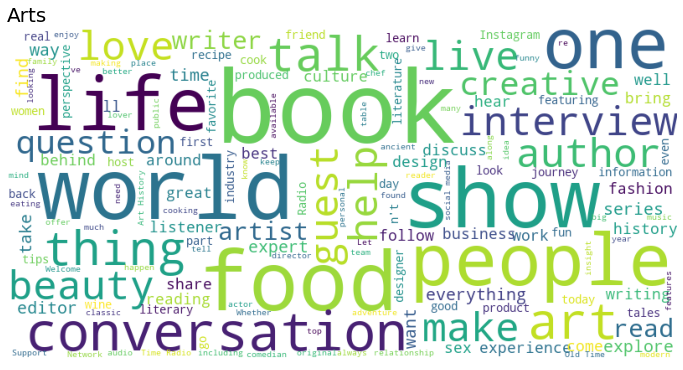

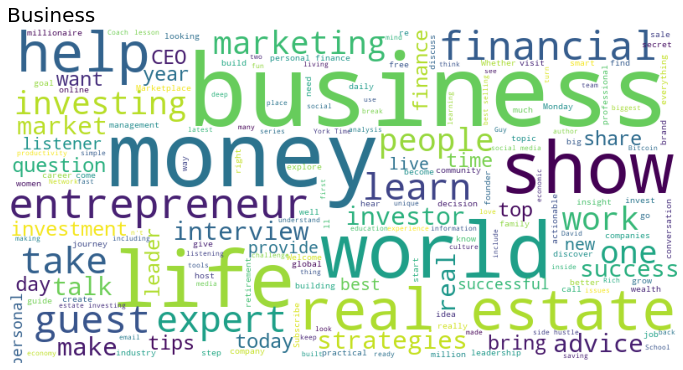

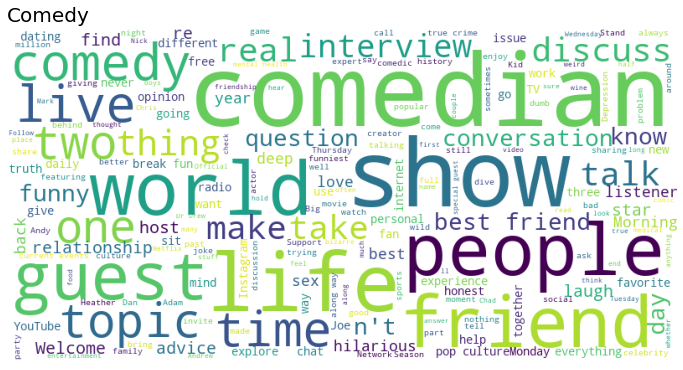

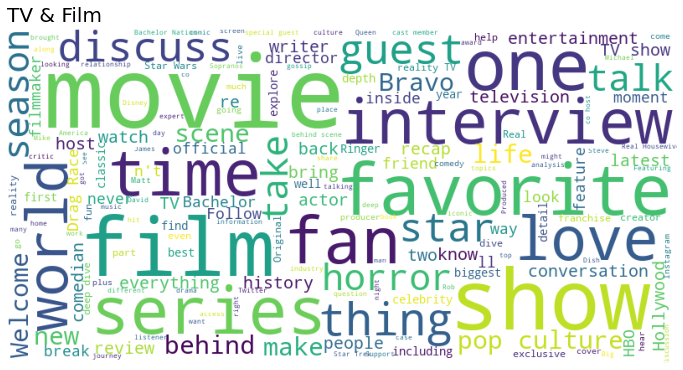

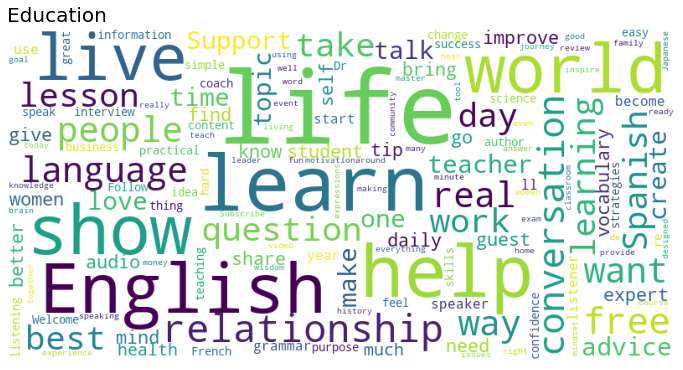

...

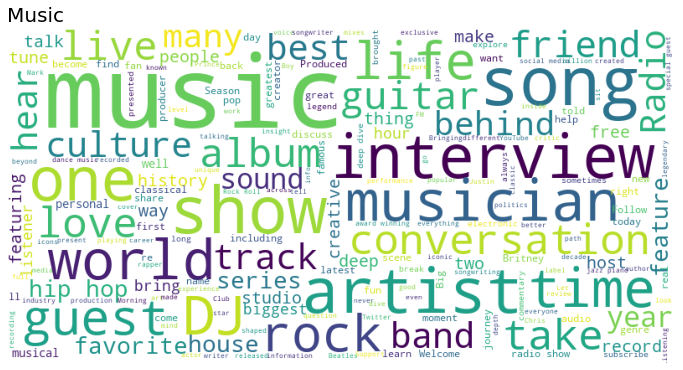

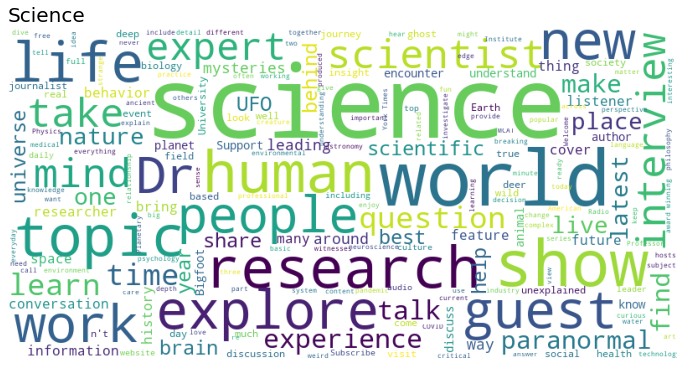

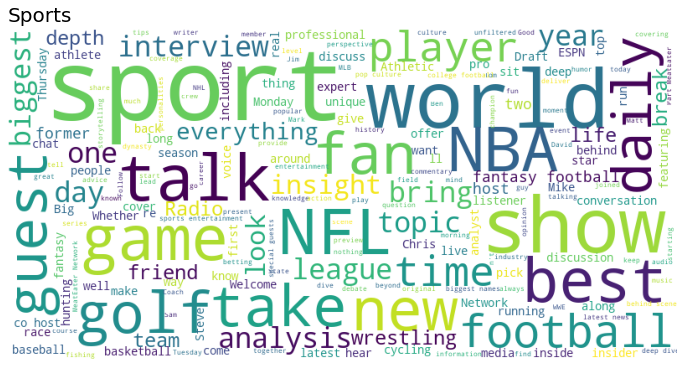

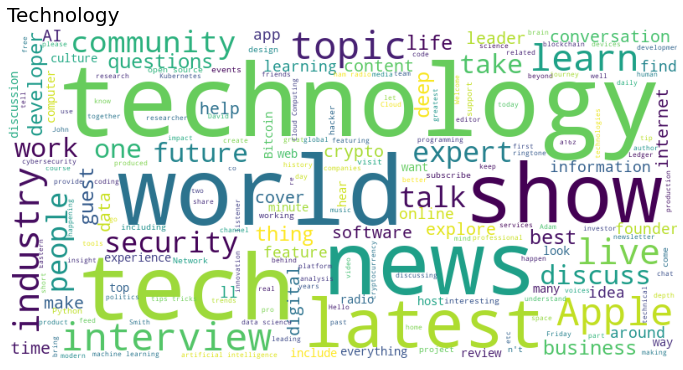

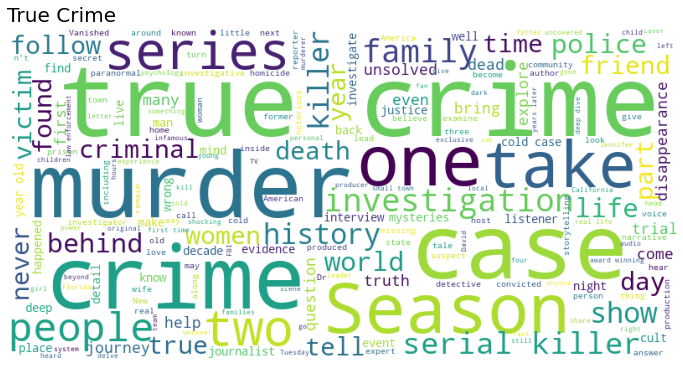

In [18]:
for i in df.genre.unique():
    wordcloud(i)